<a href="https://colab.research.google.com/github/JD39/Complex-Networks-Bullfrog/blob/main/Bullfrog_Graph_2007.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Initialization libraires

In [1]:
!pip install contextily
!pip install libpysal
!pip install geopandas
!pip install --upgrade scipy networkx
#!pip install 'networkx<2.7'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.1/20.1 MB 46.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 KB 5.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 11.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 48.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 35.7 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 26.7 MB/s eta 0:00:00
  Attempting uninstall: networkx
    Found exi

In [2]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import geopandas
import contextily as ctx
import numpy as np

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
'/content/drive/MyDrive/GRECO/Grafo_Rana_Toro/Charcos_abundancias'

'/content/drive/MyDrive/GRECO/Grafo_Rana_Toro/Charcos_abundancias'


# Grafo inicial manejo del geodataframe usando geopandas



In [62]:
gpd = geopandas.read_file('/content/drive/MyDrive/GRECO/Grafo_Rana_Toro/Charcos_abundancias/Charcos_2007.shp')
# gpd = geopandas.read_file('/content/drive/MyDrive/GRECO/Grafo_Rana_Toro/Charcos_abundancias/Charcos_2012.shp')
# gpd = geopandas.read_file('/content/drive/MyDrive/GRECO/Grafo_Rana_Toro/Charcos_abundancias/Charcos_2017.shp')
#gpd = geopandas.read_file('/content/drive/MyDrive/GRECO/Grafo_Rana_Toro/Charcos_abundancias/Charcos_2022.shp')
gpd

,TIPO_OBJET,ARE,Charco,x_coord,y_coord,Inv_2007,Abundancia,geometry
0,Agua estancada / desconocida,2085.306000,23,769323.437622,6.467164e+06,0,NaN,POINT Z (769323.438 6467163.632 0.000)
1,Agua estancada / desconocida,172.531928,9,769547.766733,6.467587e+06,1,1.0,POINT Z (769547.767 6467586.992 0.000)
2,Agua estancada / desconocida,606.122325,26,767563.656504,6.471119e+06,0,NaN,POINT Z (767563.657 6471118.706 0.000)
3,Agua estancada / desconocida,688.826974,45,770662.490438,6.465927e+06,0,NaN,POINT Z (770662.490 6465927.436 0.000)
4,Embalse/Tajamar,571.652524,36,770520.835770,6.465510e+06,0,NaN,POINT Z (770520.836 6465509.684 0.000)
...,...,...,...,...,...,...,...,...
320,Selección manual,0.000000,0,772781.943330,6.467408e+06,0,NaN,POINT Z (772781.943 6467408.368 0.000)
321,Selección manual,0.000000,0,771153.165072,6.468943e+06,0,NaN,POINT Z (771153.165 6468943.483 0.000)
322,Selección manual,0.000000,0,770965.839697,6.469240e+06,0,NaN,POINT Z (770965.840 6469240.347 0.000)
323,Selección manual,0.000000,0,772485.767373,6.464875e+06,0,NaN,POINT Z (772485.767 6464874.676 0.000)


In [65]:
#gpd['Charco'].value_counts()

In [63]:
gpd['centroid'] = gpd.centroid
gpd['centroid']

0      POINT (769323.438 6467163.632)
1      POINT (769547.767 6467586.992)
2      POINT (767563.657 6471118.706)
3      POINT (770662.490 6465927.436)
4      POINT (770520.836 6465509.684)
                    ...              
320    POINT (772781.943 6467408.368)
321    POINT (771153.165 6468943.483)
322    POINT (770965.840 6469240.347)
323    POINT (772485.767 6464874.676)
324    POINT (774099.584 6463989.087)
Name: centroid, Length: 325, dtype: geometry

In [66]:
first_point = gpd['centroid'].iloc[9]
gpd['distance'] = gpd['centroid'].distance(first_point)
gpd['distance']

0       296.710186
1       224.498334
2      4080.071010
3      2006.543147
4      2265.261597
          ...     
320    3417.921656
321    2325.489676
322    2396.500253
323    4051.431332
324    5869.593727
Name: distance, Length: 325, dtype: float64

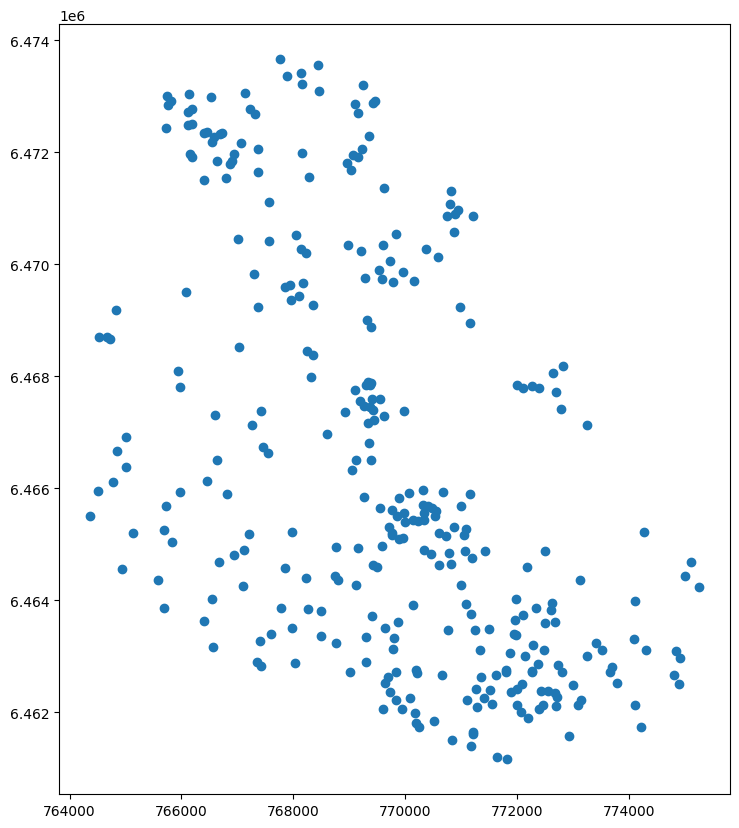

In [67]:
df=gpd
df.plot(figsize=(10, 10))
plt.show()

<Axes: >

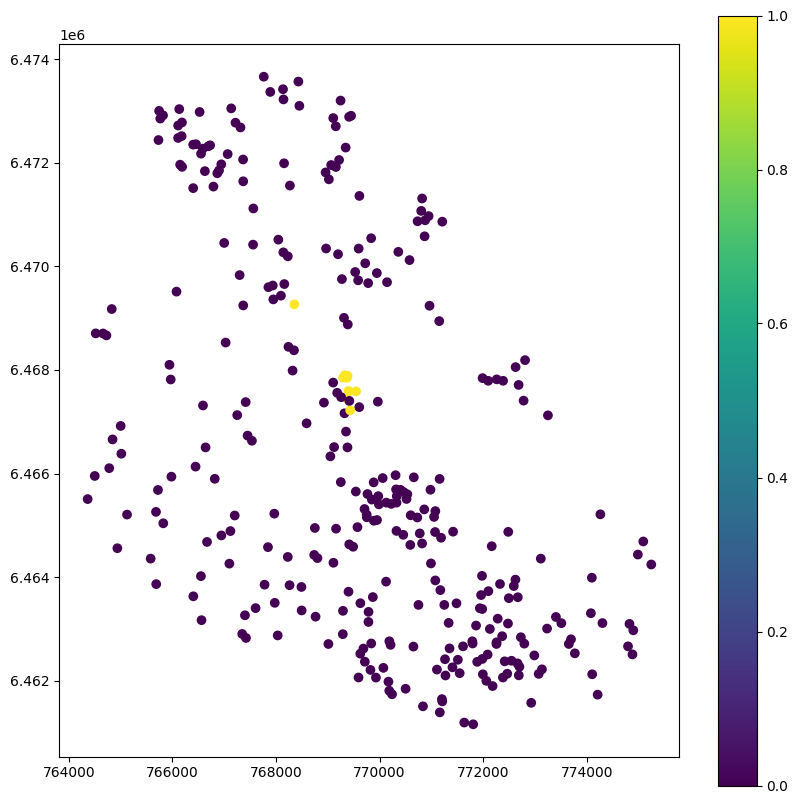

In [69]:
gdf = gpd.set_geometry("centroid")
gpd.plot("Inv_2007", legend=True, figsize=(10,10))

In [70]:
df.crs

<Projected CRS: EPSG:32721>
Name: WGS 84 / UTM zone 21S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 60°W and 54°W, southern hemisphere between 80°S and equator, onshore and offshore. Argentina. Bolivia. Brazil. Falkland Islands (Malvinas). Paraguay. Uruguay.
- bounds: (-60.0, -80.0, -54.0, 0.0)
Coordinate Operation:
- name: UTM zone 21S
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [71]:
# Use WGS 84 (epsg:4326) as the geographic coordinate system
df = df.to_crs(epsg=4326)
print(df.crs)
df

EPSG:4326


,TIPO_OBJET,ARE,Charco,x_coord,y_coord,Inv_2007,Abundancia,geometry,centroid,distance
0,Agua estancada / desconocida,2085.306000,23,769323.437622,6.467164e+06,0,NaN,POINT Z (-54.15229 -31.89952 0.00000),POINT (769323.438 6467163.632),296.710186
1,Agua estancada / desconocida,172.531928,9,769547.766733,6.467587e+06,1,1.0,POINT Z (-54.15004 -31.89565 0.00000),POINT (769547.767 6467586.992),224.498334
2,Agua estancada / desconocida,606.122325,26,767563.656504,6.471119e+06,0,NaN,POINT Z (-54.17197 -31.86429 0.00000),POINT (767563.657 6471118.706),4080.071010
3,Agua estancada / desconocida,688.826974,45,770662.490438,6.465927e+06,0,NaN,POINT Z (-54.13780 -31.91034 0.00000),POINT (770662.490 6465927.436),2006.543147
4,Embalse/Tajamar,571.652524,36,770520.835770,6.465510e+06,0,NaN,POINT Z (-54.13918 -31.91413 0.00000),POINT (770520.836 6465509.684),2265.261597
...,...,...,...,...,...,...,...,...,...,...
320,Selección manual,0.000000,0,772781.943330,6.467408e+06,0,NaN,POINT Z (-54.11583 -31.89649 0.00000),POINT (772781.943 6467408.368),3417.921656
321,Selección manual,0.000000,0,771153.165072,6.468943e+06,0,NaN,POINT Z (-54.13346 -31.88304 0.00000),POINT (771153.165 6468943.483),2325.489676
322,Selección manual,0.000000,0,770965.839697,6.469240e+06,0,NaN,POINT Z (-54.13552 -31.88041 0.00000),POINT (770965.840 6469240.347),2396.500253
323,Selección manual,0.000000,0,772485.767373,6.464875e+06,0,NaN,POINT Z (-54.11825 -31.91939 0.00000),POINT (772485.767 6464874.676),4051.431332


In [72]:
df.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

# Seleccionar solo los charcos invadidos en el 2007

In [73]:
df2=df.query('Inv_2007==1')
df2

,TIPO_OBJET,ARE,Charco,x_coord,y_coord,Inv_2007,Abundancia,geometry,centroid,distance
1,Agua estancada / desconocida,172.531928,9,769547.766733,6.467587e+06,1,1.0,POINT Z (-54.15004 -31.89565 0.00000),POINT (769547.767 6467586.992),224.498334
9,Embalse/Tajamar,472.424832,2,769364.374897,6.467458e+06,1,3.0,POINT Z (-54.15194 -31.89686 0.00000),POINT (769364.375 6467457.505),0.000000
23,Agua estancada / desconocida,390.459961,22,769432.831107,6.467222e+06,1,2.0,POINT Z (-54.15115 -31.89897 0.00000),POINT (769432.831 6467221.665),245.574319
24,Agua estancada / desconocida,64.631836,52,769296.470121,6.467853e+06,1,1.0,POINT Z (-54.15277 -31.89331 0.00000),POINT (769296.470 6467853.041),401.322603
47,Selección manual,0.000000,15,768354.864114,6.469267e+06,1,1.0,POINT Z (-54.16310 -31.88079 0.00000),POINT (768354.864 6469266.961),2072.014038
48,NaN,0.000000,24,769404.018727,6.467595e+06,1,2.0,POINT Z (-54.15156 -31.89560 0.00000),POINT (769404.019 6467595.492),143.568508
50,NaN,0.000000,53,769369.895126,6.467849e+06,1,3.0,POINT Z (-54.15199 -31.89333 0.00000),POINT (769369.895 6467848.934),391.467866
51,NaN,0.000000,54,769382.595152,6.467886e+06,1,3.0,POINT Z (-54.15187 -31.89299 0.00000),POINT (769382.595 6467885.976),428.857907
52,NaN,0.000000,55,769331.795050,6.467900e+06,1,3.0,POINT Z (-54.15241 -31.89288 0.00000),POINT (769331.795 6467899.734),443.427530


In [74]:
df2['centroid2'] = df2.centroid
df2['centroid2']

<ipython-input-74-7c264bbd38e7>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df2['centroid2'] = df2.centroid
/usr/local/lib/python3.9/dist-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


1     POINT (-54.15004 -31.89565)
9     POINT (-54.15194 -31.89686)
23    POINT (-54.15115 -31.89897)
24    POINT (-54.15277 -31.89331)
47    POINT (-54.16310 -31.88079)
48    POINT (-54.15156 -31.89560)
50    POINT (-54.15199 -31.89333)
51    POINT (-54.15187 -31.89299)
52    POINT (-54.15241 -31.89288)
Name: centroid2, dtype: geometry

In [75]:
df2.columns

Index(['TIPO_OBJET', 'ARE', 'Charco', 'x_coord', 'y_coord', 'Inv_2007',
       'Abundancia', 'geometry', 'centroid', 'distance', 'centroid2'],
      dtype='object')

In [76]:
df2['distance'].mean()

483.41456714125525

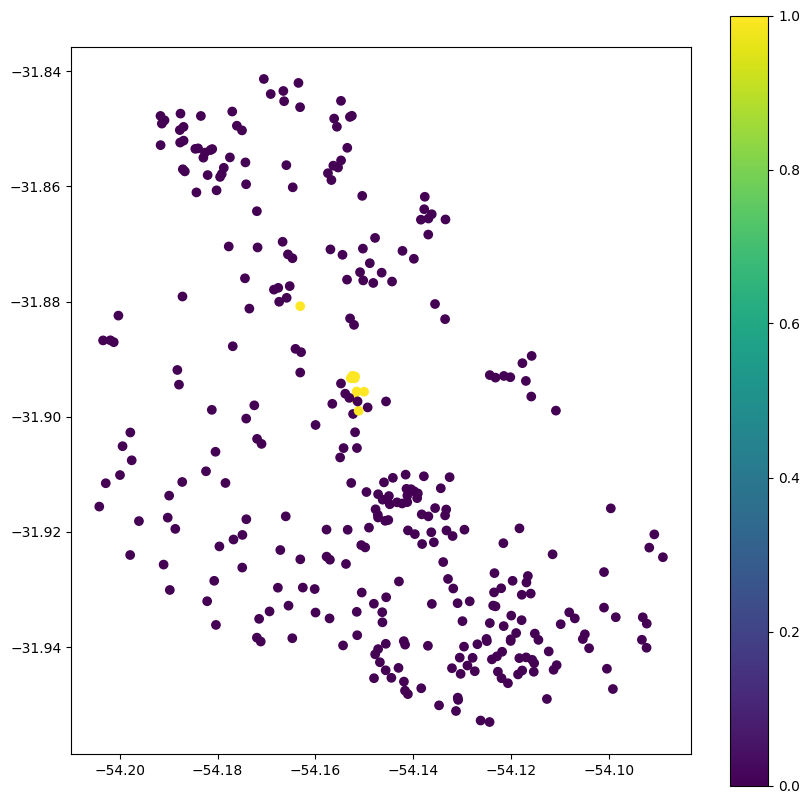

In [77]:
df.plot("Inv_2007", legend=True, figsize=(10, 10))
plt.show()


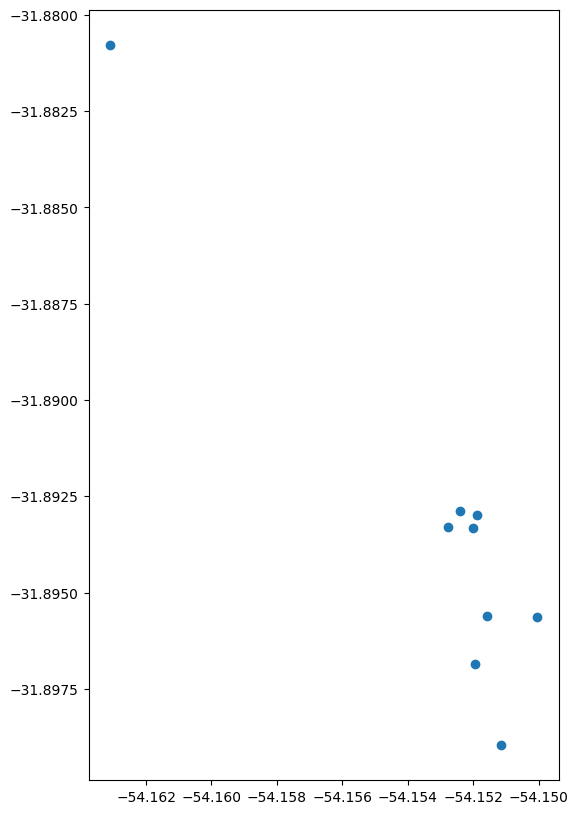

In [78]:
df2.plot(legend=True, figsize=(10, 10))
plt.show()

In [79]:
coordinates = np.column_stack((df2.geometry.x, df2.geometry.y))
coordinates

array([[-54.15004085, -31.89564738],
       [-54.15194188, -31.89685761],
       [-54.15115334, -31.89896649],
       [-54.15276887, -31.8933096 ],
       [-54.16310479, -31.8807915 ],
       [-54.15156147, -31.89560485],
       [-54.15199224, -31.89332922],
       [-54.15186839, -31.89299244],
       [-54.15240874, -31.89288049]])

Ingreso el origen de la invasion: criadero Acegua

In [80]:
coordinates_origen=np.append(coordinates, [[-54.154538, -31.893438]], axis=0)
coordinates_origen

array([[-54.15004085, -31.89564738],
       [-54.15194188, -31.89685761],
       [-54.15115334, -31.89896649],
       [-54.15276887, -31.8933096 ],
       [-54.16310479, -31.8807915 ],
       [-54.15156147, -31.89560485],
       [-54.15199224, -31.89332922],
       [-54.15186839, -31.89299244],
       [-54.15240874, -31.89288049],
       [-54.154538  , -31.893438  ]])

## Generando grafos desde geopuntos

In [81]:
from libpysal import weights, examples
from contextily import add_basemap
#from scipy.sparse import sparse_array
## 3-nearest neighbor graph, meaning that points are connected
## to the three closest other points. This means every point
## will have exactly three neighbors.
knn3 = weights.KNN.from_dataframe(df2, k=3, p=1)

##Distand band degree 0,001 grad= 111,3 m, 0,006=667.8, 0.00628
dist = weights.DistanceBand.from_array(coordinates_origen, threshold=0.006289, p=1, binary=False)

# Then, we can convert the graph to networkx object using the
# .to_networkx() method.
knn_graph = knn3.to_networkx()
dist_graph = dist.to_networkx()

/usr/local/lib/python3.9/dist-packages/scipy/sparse/_data.py:117: RuntimeWarning: divide by zero encountered in reciprocal
  return self._with_data(data ** n)
/usr/local/lib/python3.9/dist-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
 There is 1 island with id: 4.
  warnings.warn(message)


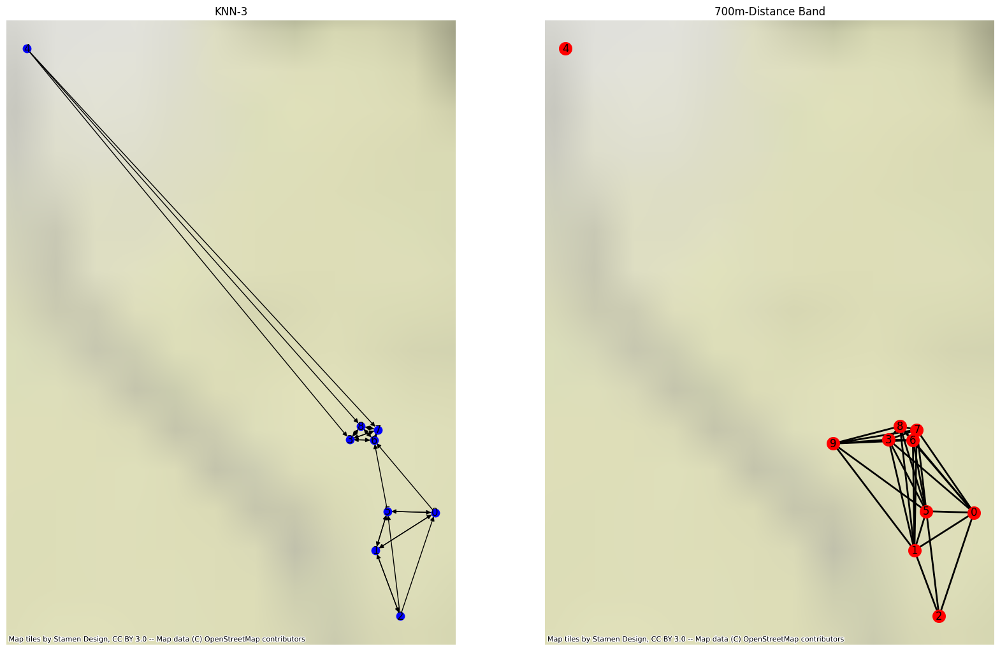

In [82]:

positions = dict(zip(dist_graph.nodes, coordinates_origen))
#positions=nx.spring_layout(knn_graph)
# plot with a nice basemap
f, ax = plt.subplots(1, 2, figsize=(20, 20))
for i, facet in enumerate(ax):
    df2.plot(marker=".",  alpha=1, color="k", ax=facet)
    add_basemap(facet, zoom=10, crs = df2.crs, url=ctx.providers.OpenStreetMap)
    facet.set_title(("KNN-3", "700m-Distance Band")[i])
    #facet.axis("off") 
nx.draw(knn_graph, positions, ax=ax[0], node_size=80, node_color="b",  with_labels='Charco') ##, with_labels='inv'
nx.draw(dist_graph, positions, ax=ax[1], node_size=200, node_color="r",  with_labels='Charco', width=2  )
plt.show()

In [83]:
positions

{0: array([-54.15004085, -31.89564738]),
 1: array([-54.15194188, -31.89685761]),
 2: array([-54.15115334, -31.89896649]),
 3: array([-54.15276887, -31.8933096 ]),
 4: array([-54.16310479, -31.8807915 ]),
 5: array([-54.15156147, -31.89560485]),
 6: array([-54.15199224, -31.89332922]),
 7: array([-54.15186839, -31.89299244]),
 8: array([-54.15240874, -31.89288049]),
 9: array([-54.154538, -31.893438])}

In [85]:
dist_graph.edges

EdgeView([(0, 1), (0, 2), (0, 3), (0, 5), (0, 6), (0, 7), (0, 8), (1, 2), (1, 3), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (2, 5), (3, 5), (3, 6), (3, 7), (3, 8), (3, 9), (5, 6), (5, 7), (5, 8), (5, 9), (6, 7), (6, 8), (6, 9), (7, 8), (7, 9), (8, 9)])

In [86]:
positions

{0: array([-54.15004085, -31.89564738]),
 1: array([-54.15194188, -31.89685761]),
 2: array([-54.15115334, -31.89896649]),
 3: array([-54.15276887, -31.8933096 ]),
 4: array([-54.16310479, -31.8807915 ]),
 5: array([-54.15156147, -31.89560485]),
 6: array([-54.15199224, -31.89332922]),
 7: array([-54.15186839, -31.89299244]),
 8: array([-54.15240874, -31.89288049]),
 9: array([-54.154538, -31.893438])}

In [87]:
min_thr = weights.min_threshold_distance(coordinates)
min_thr

0.016141533737067837

In [88]:
w_min_dist = weights.DistanceBand.from_dataframe(df, min_thr, binary=False)
w_min_dist

/usr/local/lib/python3.9/dist-packages/scipy/sparse/_data.py:117: RuntimeWarning: divide by zero encountered in reciprocal
  return self._with_data(data ** n)


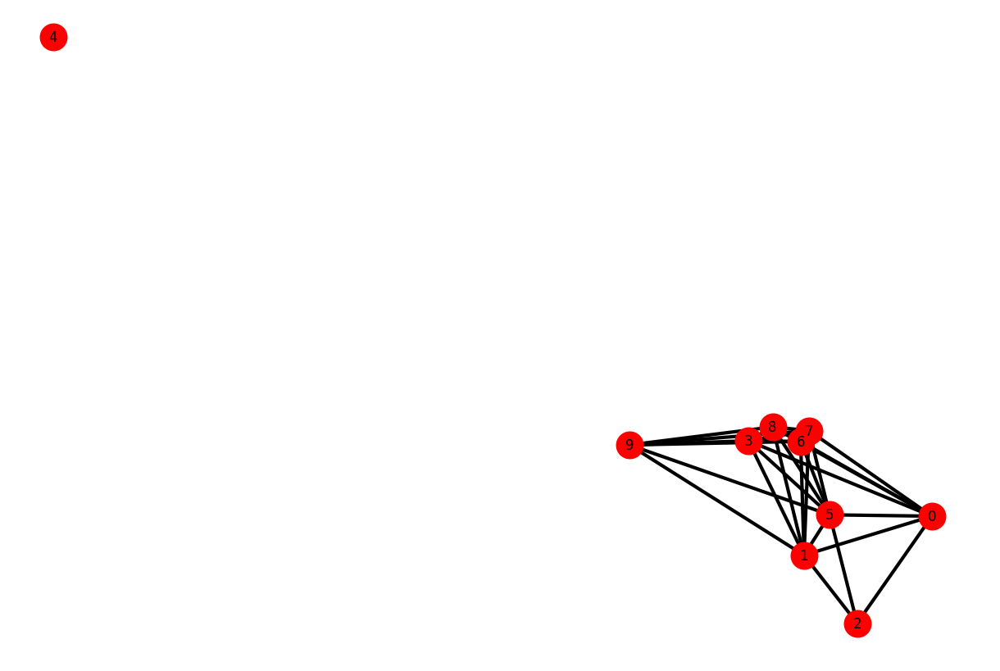

In [90]:
#nx.draw(knn_graph, positions, node_size=60, node_color="b")
plt.figure(figsize=(12, 8))
nx.draw(dist_graph, positions, node_size=550, node_color="r",with_labels=True,  width=3)
plt.show()

In [91]:
dist_graph.degree

DegreeView({0: 7, 1: 8, 2: 3, 3: 7, 4: 0, 5: 8, 6: 7, 7: 7, 8: 7, 9: 6})

In [92]:
dist_graph.edges

EdgeView([(0, 1), (0, 2), (0, 3), (0, 5), (0, 6), (0, 7), (0, 8), (1, 2), (1, 3), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (2, 5), (3, 5), (3, 6), (3, 7), (3, 8), (3, 9), (5, 6), (5, 7), (5, 8), (5, 9), (6, 7), (6, 8), (6, 9), (7, 8), (7, 9), (8, 9)])

# Caracteriticas del grafo 2007

In [93]:
G=dist_graph
#G=knn_graph  

In [94]:
G.nodes

NodeView((0, 1, 2, 3, 4, 5, 6, 7, 8, 9))

In [95]:
G.edges

EdgeView([(0, 1), (0, 2), (0, 3), (0, 5), (0, 6), (0, 7), (0, 8), (1, 2), (1, 3), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (2, 5), (3, 5), (3, 6), (3, 7), (3, 8), (3, 9), (5, 6), (5, 7), (5, 8), (5, 9), (6, 7), (6, 8), (6, 9), (7, 8), (7, 9), (8, 9)])

Feauteres of graph

In [96]:
print('num of nodes: {}'.format(G.number_of_nodes()))
print('num of edges: {}'.format(G.number_of_edges()))
G_deg = nx.degree_histogram(G)
G_deg_sum = [a * b for a, b in zip(G_deg, range(0, len(G_deg)))]
print('average degree: {}'.format(sum(G_deg_sum) / G.number_of_nodes()))
G_cluster = sorted(list(nx.clustering(G).values()))
print('average clustering coefficient: {}'.format(sum(G_cluster) / len(G_cluster)))
#print("SCC: ", nx.number_strongly_connected_components(G))
#print("WCC: ", nx.number_weakly_connected_components(G))
#print('average_shortest_path_length:', nx.average_shortest_path_length(G))
#print('triangles:', sum(nx.triangles(G).values()) / 3 )
print('density:', nx.density(G))


num of nodes: 10
num of edges: 30
average degree: 6.0
average clustering coefficient: 0.819047619047619
density: 0.6666666666666666


In [97]:
# Clustering coefficient of a specific node
print(nx.clustering(G, 9))

1.0


In [98]:
def avg_neigh_degree(g):
    return dict((n,float(sum(g.degree(i) for i in g[n]))/ g.degree(n))
    for n in g.nodes() if g.degree(n))

In [99]:
avg_neigh_degree(G)

{0: 6.714285714285714,
 1: 6.5,
 2: 7.666666666666667,
 3: 7.142857142857143,
 5: 6.5,
 6: 7.142857142857143,
 7: 7.142857142857143,
 8: 7.142857142857143,
 9: 7.333333333333333}

In [100]:
#centrality
bet_cen = nx.betweenness_centrality(G)
clo_cen = nx.closeness_centrality(G)

In [101]:
nx.number_of_isolates(G)

1

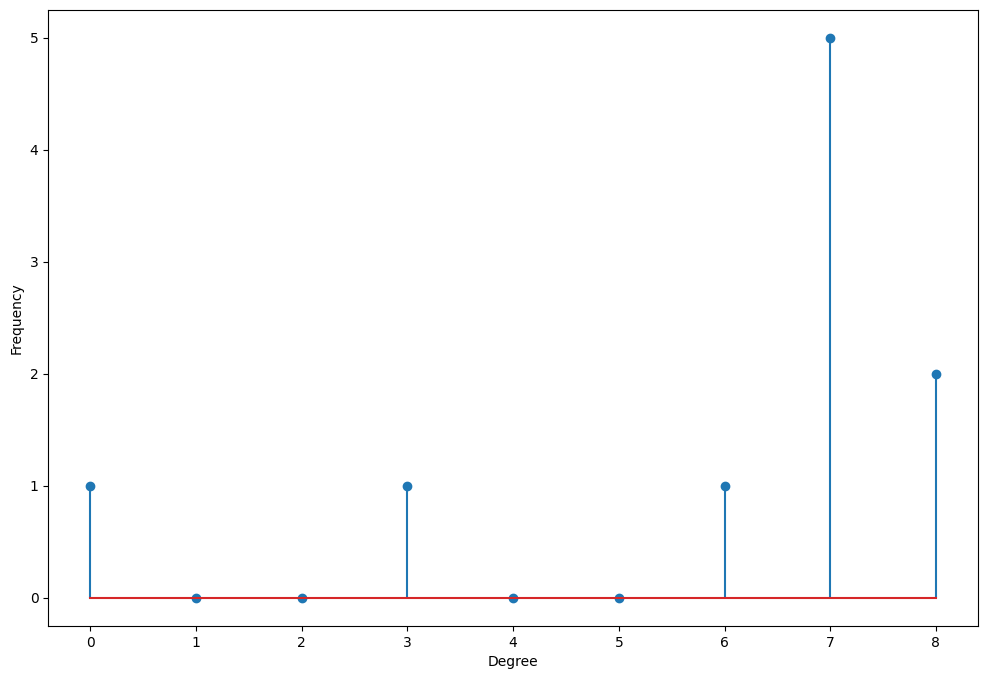

In [102]:
# Degree histogram
import numpy as np
degree_freq = np.array(nx.degree_histogram(G)).astype('float')
plt.figure(figsize=(12, 8))
plt.stem(degree_freq)
plt.ylabel("Frequency")
plt.xlabel("Degree")
plt.show()

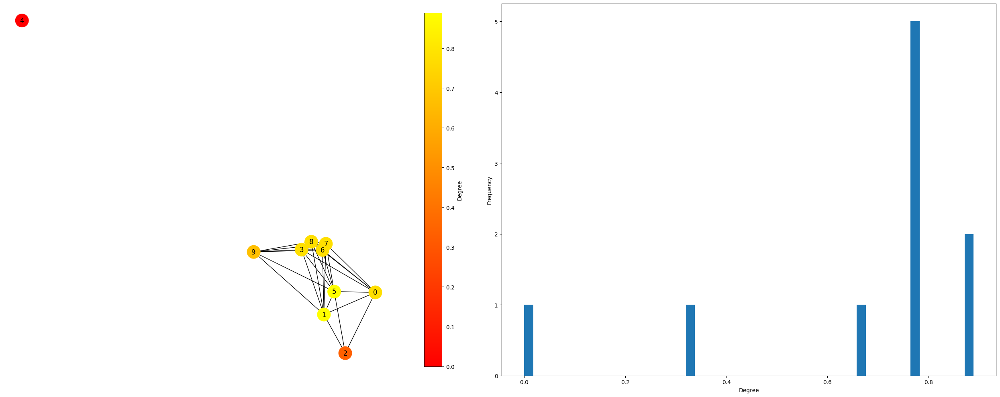

In [104]:
#Clustering coefficient and clustering histogram
from matplotlib.cm import ScalarMappable
#gc=G.subgraph(max(nx.connected_components(G)))
#lcc = nx.clustering(G)
#lcc=nx.betweenness_centrality(gc)
#lcc= nx.closeness_centrality(gc)
lcc= nx.degree_centrality(G)
#pos = nx.spring_layout(gc, seed=1)
cmap = plt.get_cmap('autumn')
norm = plt.Normalize(0, max(lcc.values()))
node_colors = [cmap(norm(lcc[node])) for node in G.nodes]

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(25, 10))

nx.draw(G,positions, node_color=node_colors, node_size=550, with_labels="Charco", ax=ax1)
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Degree', shrink=0.95, ax=ax1)

ax2.hist(lcc.values(), bins=50)
ax2.set_xlabel('Degree')
ax2.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

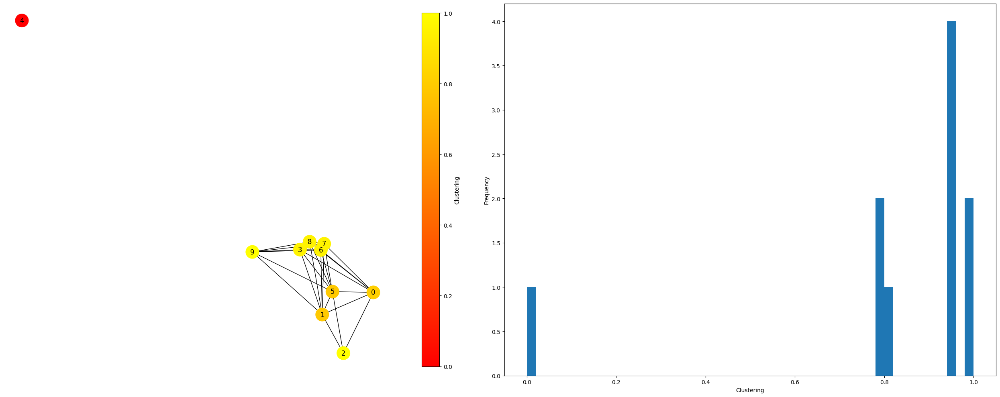

In [105]:
#Clustering coefficient and clustering histogram
from matplotlib.cm import ScalarMappable
#gc=G.subgraph(max(nx.connected_components(G)))
lcc = nx.clustering(G)
#lcc=nx.betweenness_centrality(gc)
#lcc= nx.closeness_centrality(gc)
#lcc= nx.degree_centrality(gc)
#pos = nx.spring_layout(gc, seed=1)
cmap = plt.get_cmap('autumn')
norm = plt.Normalize(0, max(lcc.values()))
node_colors = [cmap(norm(lcc[node])) for node in G.nodes]

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(25, 10))

nx.draw(G,positions, node_color=node_colors, node_size=550, with_labels="Charco", ax=ax1)
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Clustering', shrink=0.95, ax=ax1)

ax2.hist(lcc.values(), bins=50)
ax2.set_xlabel('Clustering')
ax2.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

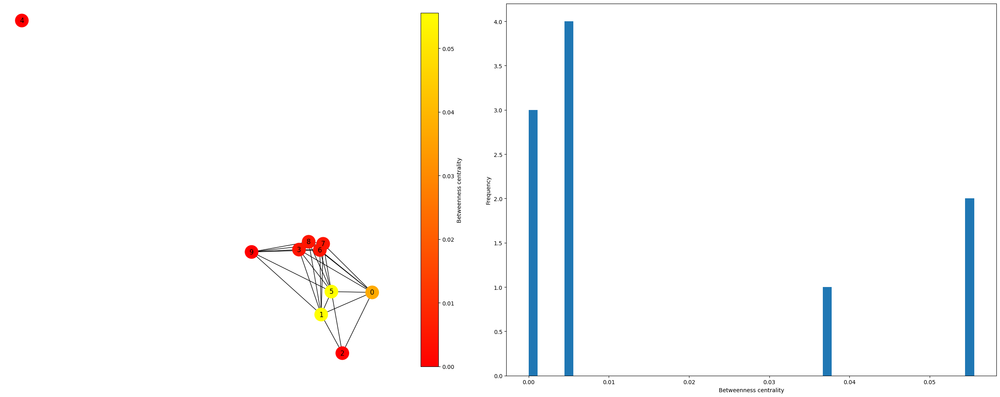

In [106]:
#Clustering coefficient and clustering histogram
from matplotlib.cm import ScalarMappable
#gc=G.subgraph(max(nx.connected_components(G)))
#lcc = nx.clustering(gc)
lcc=nx.betweenness_centrality(G)
#lcc= nx.closeness_centrality(gc)
#lcc= nx.degree_centrality(gc)
#pos = nx.spring_layout(gc, seed=1)
cmap = plt.get_cmap('autumn')
norm = plt.Normalize(0, max(lcc.values()))
node_colors = [cmap(norm(lcc[node])) for node in G.nodes]

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(25, 10))

nx.draw(G,positions, node_color=node_colors, node_size=550, with_labels="Charco", ax=ax1)
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Betweenness centrality', shrink=0.95, ax=ax1)

ax2.hist(lcc.values(), bins=50)
ax2.set_xlabel('Betweenness centrality')
ax2.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

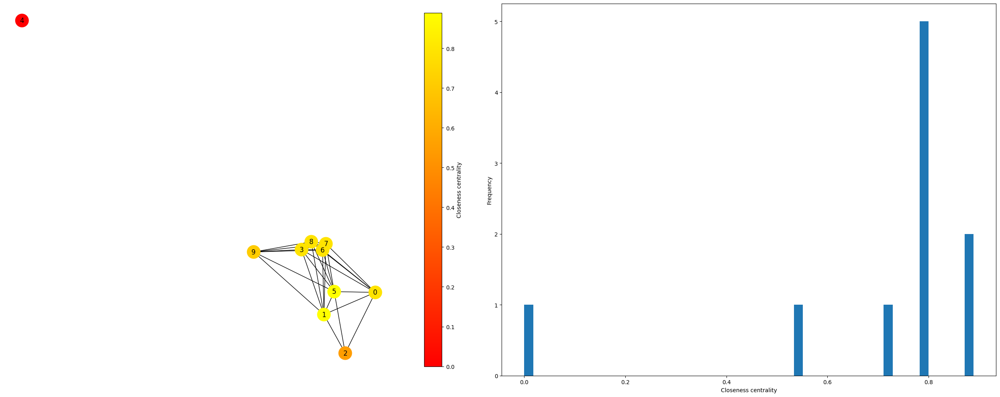

In [107]:
from matplotlib.cm import ScalarMappable
#gc=G.subgraph(max(nx.connected_components(G)))
#lcc = nx.clustering(gc)
#lcc=nx.betweenness_centrality(gc)
lcc= nx.closeness_centrality(G)
#lcc= nx.degree_centrality(gc)
#pos = nx.spring_layout(gc, seed=1)
cmap = plt.get_cmap('autumn')
norm = plt.Normalize(0, max(lcc.values()))
node_colors = [cmap(norm(lcc[node])) for node in G.nodes]

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(25, 10))

nx.draw(G,positions, node_color=node_colors,node_size=550, with_labels="Charco", ax=ax1)
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Closeness centrality', shrink=0.95, ax=ax1)

ax2.hist(lcc.values(), bins=50)
ax2.set_xlabel('Closeness centrality')
ax2.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

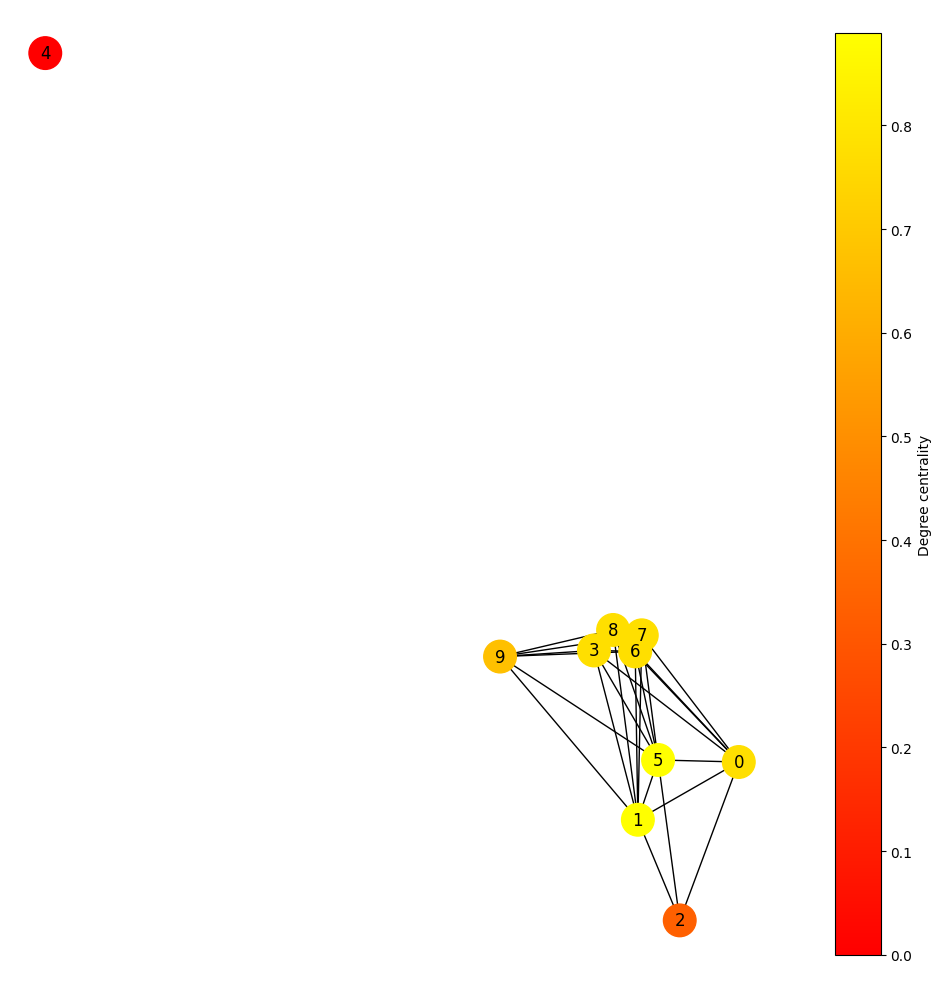

In [108]:
from matplotlib.cm import ScalarMappable
#gc=G.subgraph(max(nx.connected_components(G)))
#lcc = nx.clustering(gc)
#lcc=nx.betweenness_centrality(gc)
#lcc= nx.closeness_centrality(gc)
lcc= nx.degree_centrality(G)
#pos = nx.spring_layout(gc, seed=1)
cmap = plt.get_cmap('autumn')
norm = plt.Normalize(0, max(lcc.values()))
node_colors = [cmap(norm(lcc[node])) for node in G.nodes]

fig, (ax1) = plt.subplots(ncols=1, figsize=(10, 10))

nx.draw(G, positions, node_color=node_colors, node_size=550, with_labels="Charco", ax=ax1)
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Degree centrality', shrink=0.95, ax=ax1)

# ax2.hist(lcc.values(), bins=50)
# ax2.set_xlabel('Degree centrality')
# ax2.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

In [109]:
G_cluster = sorted(list(nx.clustering(G).values()))
print('average clustering coefficient: {}'.format(sum(G_cluster) / len(G_cluster)))

average clustering coefficient: 0.819047619047619


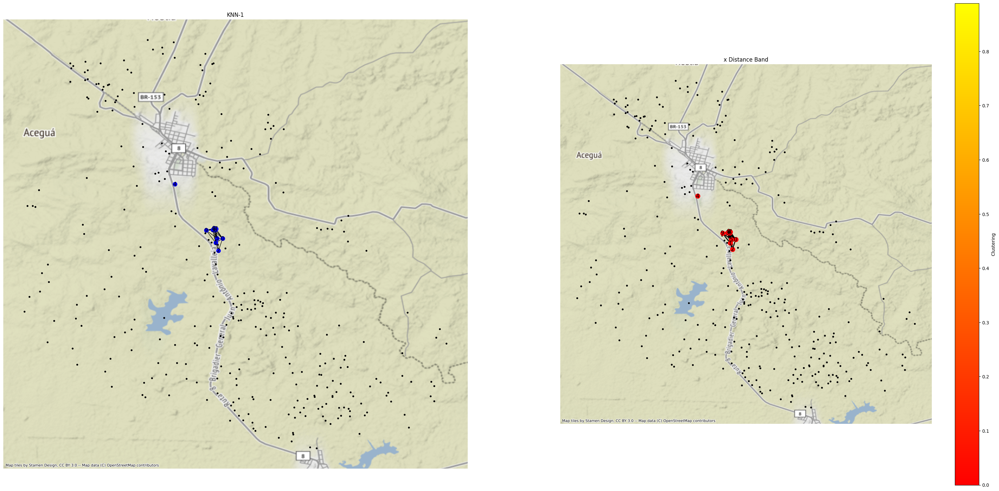

In [110]:
positions = dict(zip(dist_graph.nodes, coordinates_origen))
#positions=nx.spring_layout(knn_graph)
# plot with a nice basemap
f, ax = plt.subplots(1, 2, figsize=(40, 20))
for i, facet in enumerate(ax):
    df.plot(marker=".",  alpha=1, color="k", ax=facet)
    add_basemap(facet, zoom=13, crs = df2.crs, url=ctx.providers.OpenStreetMap)
    facet.set_title(("KNN-1", "x Distance Band")[i])
    #facet.axis("off") 
nx.draw(dist_graph, positions, ax=ax[0], node_size=80, node_color="b",  with_labels='Charco') ##, with_labels='inv'
nx.draw(dist_graph, positions, ax=ax[1], node_size=100, node_color='r',  with_labels='Charco', width=2  )
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Clustering', shrink=0.95, ax=ax[1])
plt.show()

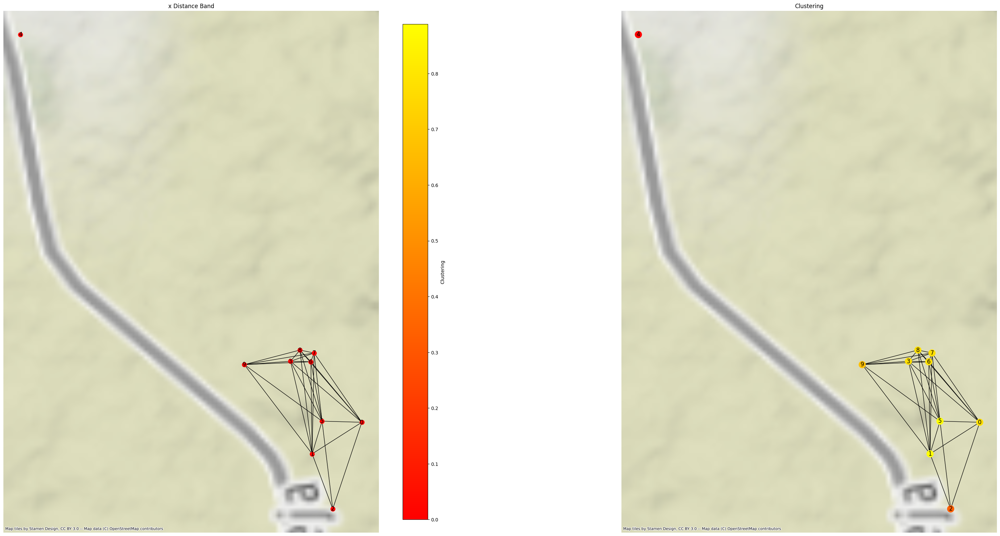

In [111]:
positions = dict(zip(dist_graph.nodes, coordinates_origen))
#positions=nx.spring_layout(knn_graph)
# plot with a nice basemap
f, ax = plt.subplots(1, 2, figsize=(40, 20))
for i, facet in enumerate(ax):
    df2.plot(marker=".",  alpha=1, color="k", ax=facet)
    add_basemap(facet, zoom=13, crs = df2.crs, url=ctx.providers.OpenStreetMap)
    facet.set_title(("x Distance Band", "Clustering" )[i])
    #facet.axis("off") 
nx.draw(G, positions, ax=ax[0], node_size=90, node_color="r", with_labels='Inv')
nx.draw(G, positions, ax=ax[1], node_size=200, node_color=node_colors, with_labels='Inv')
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Clustering', shrink=0.95, ax=ax[0])
plt.show()

In [112]:
def plot_degree_dist_directed(G,bins):
    degrees = [G.degree(n) for n in G.nodes()]
    ent = pd.DataFrame(dict(deg_in = [G.in_degree(n) for n in G.nodes()]))
    sai = pd.DataFrame(dict(deg_out = [G.out_degree(n) for n in G.nodes()]))
    
    plt.figure(figsize=(20,10))
    fig, axes = plt.subplots(1, 2)

    ent.hist('deg_in', bins=20, ax=axes[0])
    sai.hist('deg_out', bins=20, ax=axes[1])

    axes[0].set_ylabel('Frecuency')
    axes[1].set_ylabel('Frecuency')

    axes[0].set_xlabel('$k_{in}$')
    axes[1].set_xlabel('$k_{out}$')

    plt.show()

In [113]:
nx.degree_pearson_correlation_coefficient(G)

-0.2583412774070544

# Buscando Comunidades

In [114]:
!pip install python-louvain
from community import community_louvain
import matplotlib.cm as cm
#from networkx.algorithms import community
#from networkx.algorithms.community.centrality import girvan_newman
partition = community_louvain.best_partition(G)
values = [partition.get(node) for node in G.nodes()]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


<ipython-input-115-ab38a01b83a6>:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


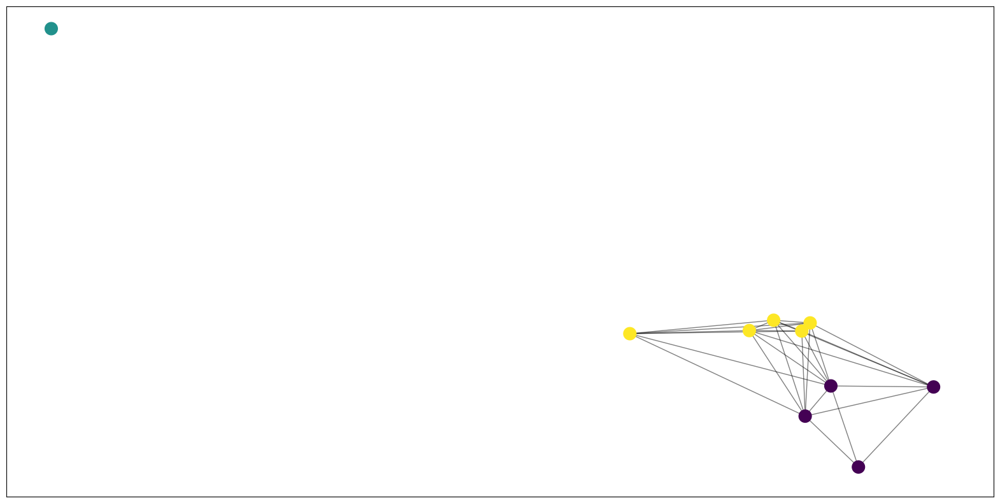

In [115]:
plt.figure(figsize=(20, 10))
#pos = nx.spring_layout(G, seed=1)
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(G, positions, partition.keys(), node_size=200, cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, positions, alpha=0.5)
plt.show()

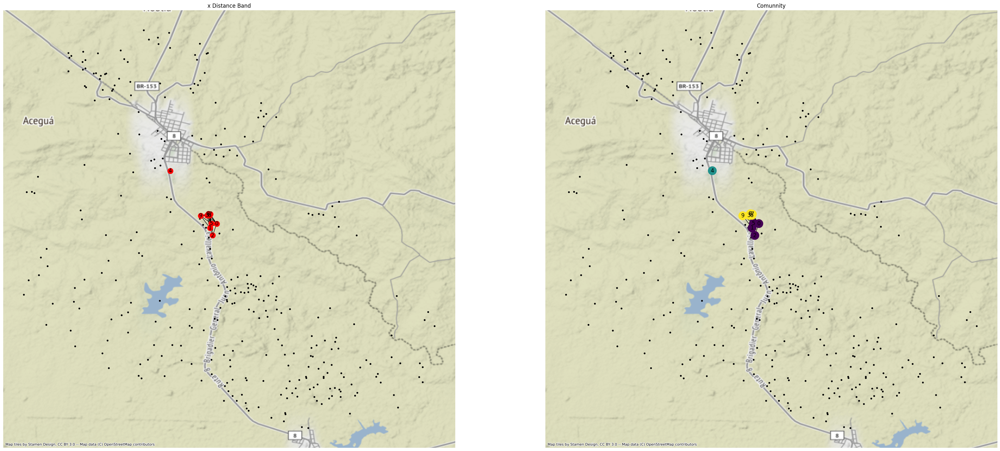

In [116]:
positions = dict(zip(dist_graph.nodes, coordinates_origen))
#positions=nx.spring_layout(knn_graph)
# plot with a nice basemap
f, ax = plt.subplots(1, 2, figsize=(40, 20))
for i, facet in enumerate(ax):
    df.plot(marker=".",  alpha=1, color="k", ax=facet)
    add_basemap(facet, zoom=13, crs = df.crs, url=ctx.providers.OpenStreetMap)
    facet.set_title(("x Distance Band", "Comunnity")[i])
    #facet.axis("off") 
nx.draw(G, positions, ax=ax[1], node_size=350, node_color=list(partition.values()), with_labels='inv')
nx.draw(G, positions, ax=ax[0], node_size=150, node_color="r", with_labels='Charco')
plt.show()

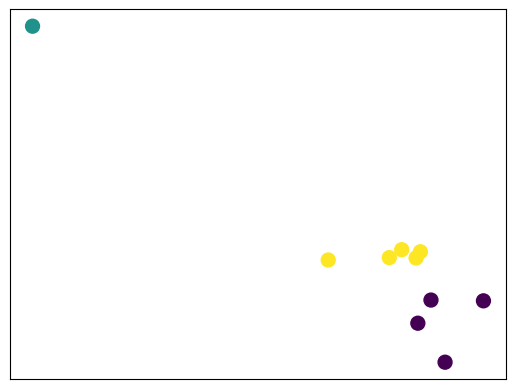

In [117]:
nx.draw_networkx_nodes(values, positions, partition.keys(), node_size=100,cmap=cmap, node_color=list(values))

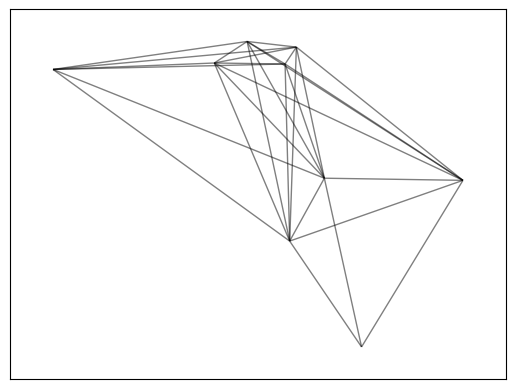

In [118]:
nx.draw_networkx_edges(G, positions, alpha=0.5)

In [119]:
positions

{0: array([-54.15004085, -31.89564738]),
 1: array([-54.15194188, -31.89685761]),
 2: array([-54.15115334, -31.89896649]),
 3: array([-54.15276887, -31.8933096 ]),
 4: array([-54.16310479, -31.8807915 ]),
 5: array([-54.15156147, -31.89560485]),
 6: array([-54.15199224, -31.89332922]),
 7: array([-54.15186839, -31.89299244]),
 8: array([-54.15240874, -31.89288049]),
 9: array([-54.154538, -31.893438])}

# Pruebas 

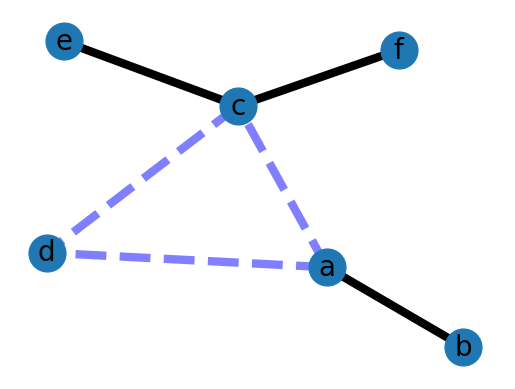

In [120]:
# Author: Aric Hagberg (hagberg@lanl.gov)
import matplotlib.pyplot as plt
import networkx as nx

G = nx.Graph()

G.add_edge('a', 'b', weight=0.6)
G.add_edge('a', 'c', weight=0.2)
G.add_edge('c', 'd', weight=0.1)
G.add_edge('c', 'e', weight=0.7)
G.add_edge('c', 'f', weight=0.9)
G.add_edge('a', 'd', weight=0.3)

elarge = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] > 0.5]
esmall = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] <= 0.5]

pos = nx.spring_layout(G)  # positions for all nodes

# nodes
nx.draw_networkx_nodes(G, pos, node_size=700)

# edges
nx.draw_networkx_edges(G, pos, edgelist=elarge,
                       width=6)
nx.draw_networkx_edges(G, pos, edgelist=esmall,
                       width=6, alpha=0.5, edge_color='b', style='dashed')

# labels
nx.draw_networkx_labels(G, pos, font_size=20, font_family='sans-serif')

plt.axis('off')
plt.show()

source vertex {target:length, }
0 {0: 0, 1: 1, 2: 1, 3: 1, 5: 1, 6: 1, 7: 1, 8: 1, 9: 2} 
1 {1: 0, 0: 1, 2: 1, 3: 1, 5: 1, 6: 1, 7: 1, 8: 1, 9: 1} 
2 {2: 0, 0: 1, 1: 1, 5: 1, 3: 2, 6: 2, 7: 2, 8: 2, 9: 2} 
3 {3: 0, 0: 1, 1: 1, 5: 1, 6: 1, 7: 1, 8: 1, 9: 1, 2: 2} 
5 {5: 0, 0: 1, 1: 1, 2: 1, 3: 1, 6: 1, 7: 1, 8: 1, 9: 1} 
6 {6: 0, 0: 1, 1: 1, 3: 1, 5: 1, 7: 1, 8: 1, 9: 1, 2: 2} 
7 {7: 0, 0: 1, 1: 1, 3: 1, 5: 1, 6: 1, 8: 1, 9: 1, 2: 2} 
8 {8: 0, 0: 1, 1: 1, 3: 1, 5: 1, 6: 1, 7: 1, 9: 1, 2: 2} 
9 {9: 0, 1: 1, 3: 1, 5: 1, 6: 1, 7: 1, 8: 1, 0: 2, 2: 2} 

average shortest path length 1.037037037037037

length #paths
0 9
1 60
2 12
radius: 1
diameter: 2
eccentricity: {0: 2, 1: 1, 2: 2, 3: 2, 5: 1, 6: 2, 7: 2, 8: 2, 9: 2}
center: [1, 5]
periphery: [0, 2, 3, 6, 7, 8, 9]
density: 0.8333333333333334


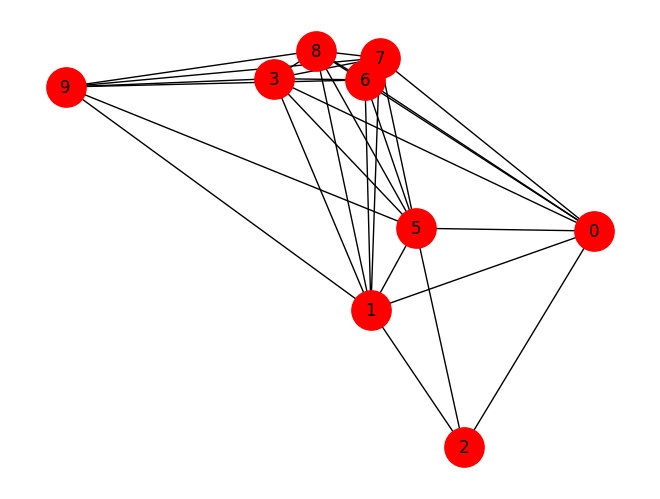

In [121]:
#    Copyright (C) 2004-2019 by
#    Aric Hagberg <hagberg@lanl.gov>
#    Dan Schult <dschult@colgate.edu>
#    Pieter Swart <swart@lanl.gov>
#    All rights reserved.
#    BSD license.


#G = nx.lollipop_graph(4, 6)
G=dist_graph.subgraph(max(nx.connected_components(dist_graph)))

pathlengths = []

print("source vertex {target:length, }")
for v in G.nodes():
    spl = dict(nx.single_source_shortest_path_length(G, v))
    print('{} {} '.format(v, spl))
    for p in spl:
        pathlengths.append(spl[p])

print('')
print("average shortest path length %s" % (sum(pathlengths) / len(pathlengths)))

# histogram of path lengths
dist = {}
for p in pathlengths:
    if p in dist:
        dist[p] += 1
    else:
        dist[p] = 1

print('')
print("length #paths")
verts = dist.keys()
for d in sorted(verts):
    print('%s %d' % (d, dist[d]))

print("radius: %d" % nx.radius(G))
print("diameter: %d" % nx.diameter(G))
print("eccentricity: %s" % nx.eccentricity(G))
print("center: %s" % nx.center(G))
print("periphery: %s" % nx.periphery(G))
print("density: %s" % nx.density(G))

nx.draw(G, positions, node_size=800, with_labels=True, node_color='r')
plt.show()

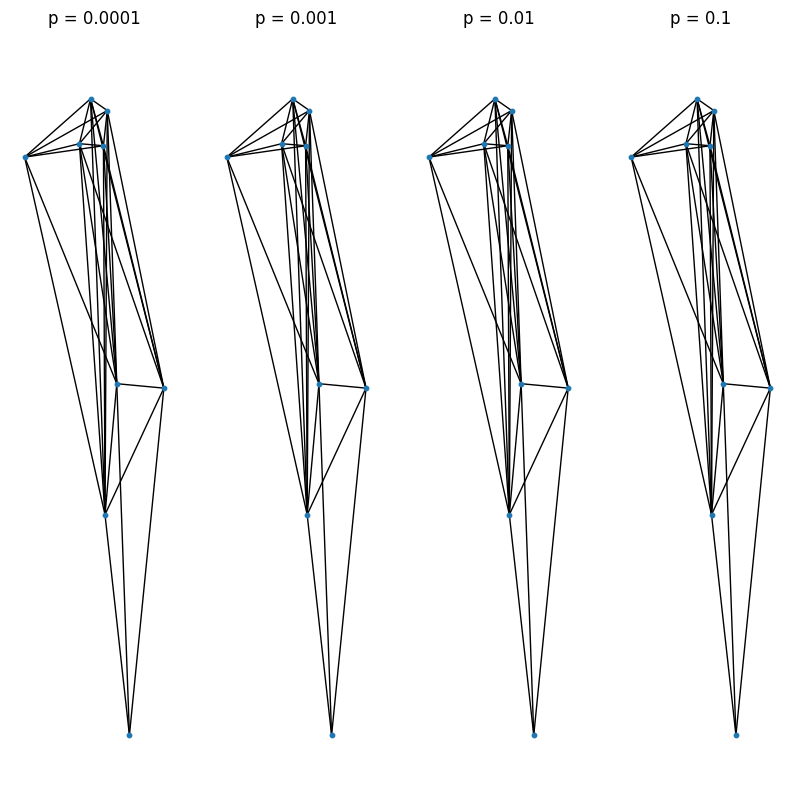

In [122]:
from pylab import *
fig = plt.figure("Percolation", figsize=(10, 10))
for i, p in [(1, 0.0001), (2, 0.001), (3, 0.01), (4, 0.1)]: 
   subplot(1, 4, i)
   title( 'p = ' + str(p))
   #G=dist_graph
#g = nx.erdos_renyi_graph(100, p)
   nx.draw(G, positions, node_size = 10)

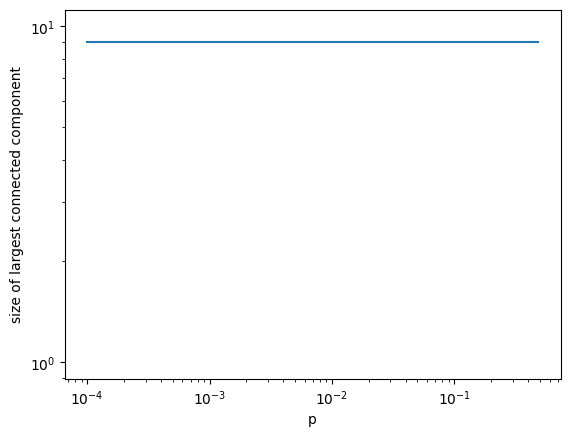

In [123]:
from pylab import *
p = 0.0001
pdata = []
gdata = []
while p < 0.5:
   pdata.append(p)
    #g = nx.erdos_renyi_graph(100, p)
   ccs = nx.connected_components(dist_graph)
   gdata.append(max(len(cc) for cc in ccs))
   p *= 1.1

loglog(pdata, gdata)
xlabel('p')
ylabel('size of largest connected component')
show()

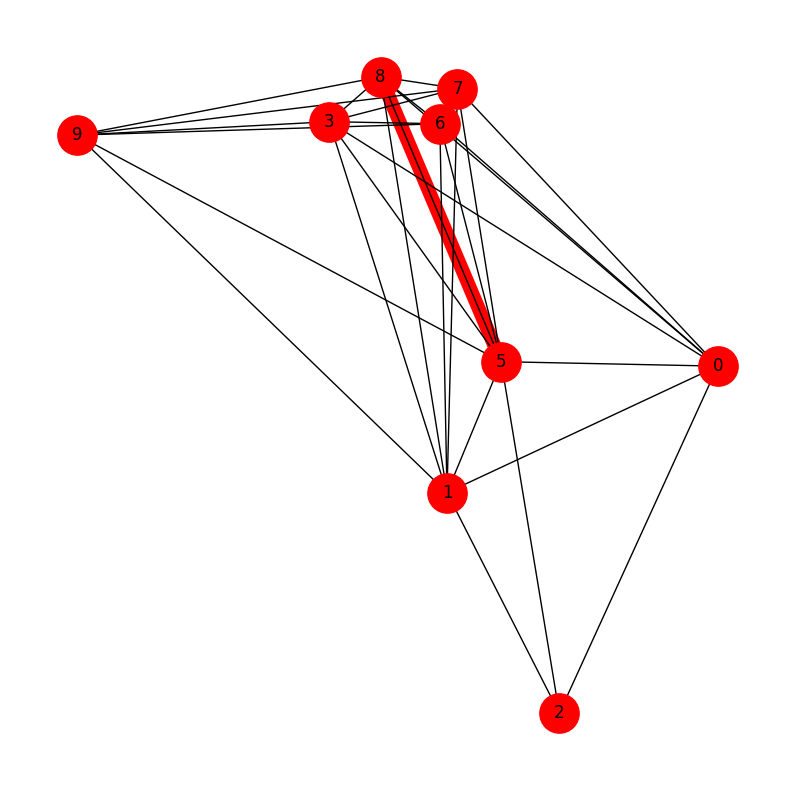

In [124]:
from pylab import *

#g = nx.karate_club_graph() 
#positions = nx.spring_layout(g)
gc=dist_graph.subgraph(max(nx.connected_components(dist_graph)))
fig = plt.figure("Shortest path", figsize=(10, 10))
path = nx.shortest_path(G, 5, 8)
edges = [(path[i], path[i+1]) for i in range(len(path) - 1)]
nx.draw_networkx_edges(gc, positions, edgelist = edges, edge_color = 'r', width = 10)
nx.draw(gc, positions, with_labels = True, node_color='r', node_size=800)
show()


In [125]:
nx.core_number(gc)

{0: 6, 1: 6, 2: 3, 3: 6, 5: 6, 6: 6, 7: 6, 8: 6, 9: 6}

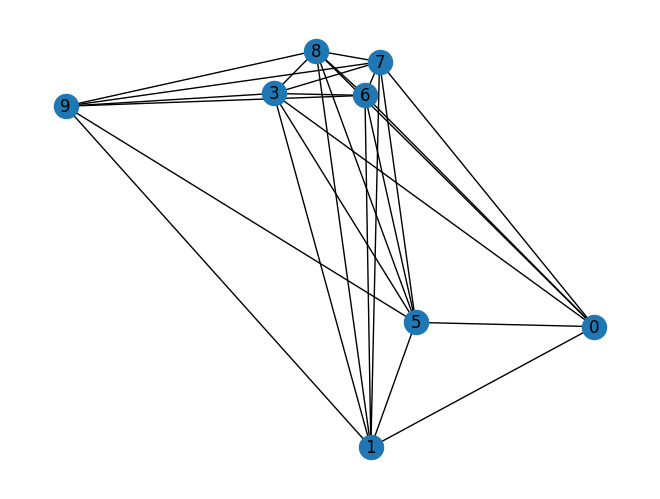

In [126]:
nx.draw(nx.k_core(gc), positions, with_labels = True) 
show()

# Prueba de pequeño mundo

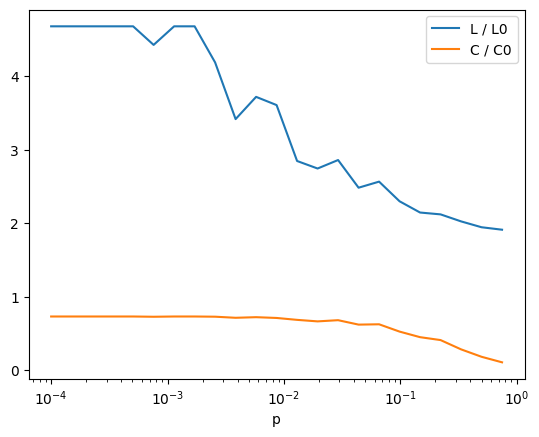

In [127]:
pdata = []
Ldata = []
Cdata = []
#g0 = nx.watts_strogatz_graph(1000, 10, 0) 
L0 = nx.average_shortest_path_length(gc)
C0 = nx.average_clustering(gc)
p = 0.0001 
while p < 1.0:
  g = nx.watts_strogatz_graph(100, 10, p)
  #g=dist_graph.subgraph(max(nx.connected_components(dist_graph))) 
  pdata.append(p)
  Ldata.append(nx.average_shortest_path_length(g) / L0) 
  Cdata.append(nx.average_clustering(g) / C0)
  p *= 1.5

semilogx(pdata, Ldata, label = 'L / L0')
semilogx(pdata, Cdata, label = 'C / C0')
xlabel('p')
legend()
show()

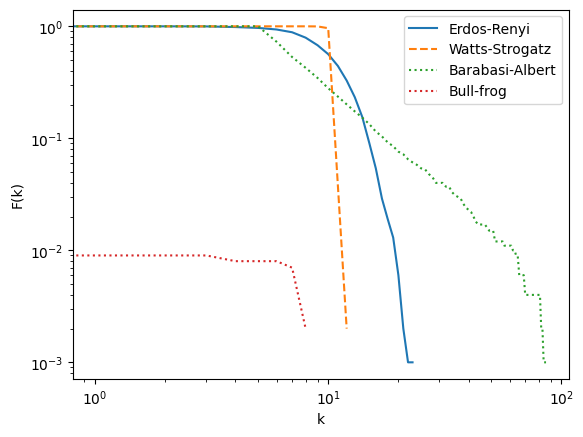

In [128]:
n = 1000
er = nx.erdos_renyi_graph(n, 0.01)
ws = nx.watts_strogatz_graph(n, 10, 0.01) 
ba = nx.barabasi_albert_graph(n, 5)

Pk = [float(x) / n for x in nx.degree_histogram(er)]
domain = range(len(Pk))
ccdf = [sum(Pk[k:]) for k in domain]
loglog(domain, ccdf, '-', label = 'Erdos-Renyi')

Pk = [float(x) / n for x in nx.degree_histogram(ws)] 
domain = range(len(Pk))
ccdf = [sum(Pk[k:]) for k in domain]
loglog(domain, ccdf, '--', label = 'Watts-Strogatz')

Pk = [float(x) / n for x in nx.degree_histogram(ba)] 
domain = range(len(Pk))
ccdf = [sum(Pk[k:]) for k in domain]
loglog(domain, ccdf, ':', label = 'Barabasi-Albert')

Pk = [float(x) / n for x in nx.degree_histogram(G)] 
domain = range(len(Pk))
ccdf = [sum(Pk[k:]) for k in domain]
loglog(domain, ccdf, ':', label = 'Bull-frog')

xlabel('k')
ylabel('F(k)')
legend()
show()

# Teoria Espectral de Grafos

 Eigenvalues
1.   



In [129]:
!pip install --upgrade scipy networkx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [130]:
knn_graph=G
A=nx.adjacency_matrix(knn_graph, nodelist=None, dtype=None, weight='weight')
A

<9x9 sparse array of type '<class 'numpy.float64'>'
	with 60 stored elements in Compressed Sparse Row format>

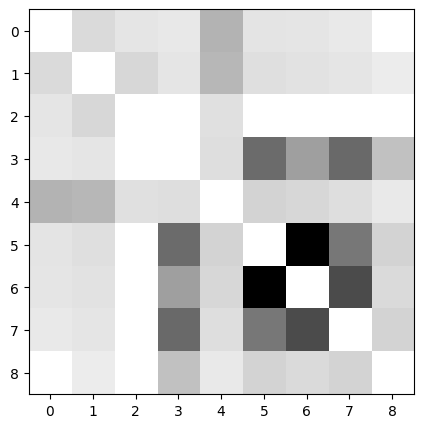

In [131]:
#Adjacency matrix
plt.figure(figsize=(10, 5))
A_adj = nx.adjacency_matrix(G)
A_adj = A_adj.todense()
plt.imshow(A_adj.T,cmap=cm.binary)
plt.show()

In [132]:
#print(A)

In [133]:
D = A.todense()
# Representación de una matriz densa
print(D)

[[   0.          321.41362559  225.65222797  197.4023116   639.73747704
   234.21702858  223.09093156  194.75063594    0.        ]
 [ 321.41362559    0.          345.13427365  228.57106341  612.30910742
   279.42681749  253.8938259   225.02343373  166.23081175]
 [ 225.65222797  345.13427365    0.            0.          265.26786182
     0.            0.            0.            0.        ]
 [ 197.4023116   228.57106341    0.            0.          285.49766479
  1255.88315364  821.25790566 1267.04856683  527.00217229]
 [ 639.73747704  612.30910742  265.26786182  285.49766479    0.
   369.4940946   342.54365301  279.98419051  194.42465721]
 [ 234.21702858  279.42681749    0.         1255.88315364  369.4940946
     0.         2170.92431583 1155.76601298  376.71361507]
 [ 223.09093156  253.8938259     0.          821.25790566  342.54365301
  2170.92431583    0.         1533.05037421  321.00980172]
 [ 194.75063594  225.02343373    0.         1267.04856683  279.98419051
  1155.76601298 1533

In [134]:
lambdas=nx.adjacency_spectrum(knn_graph, weight='weight')
lambdas

array([ 4552.85649704+0.j,  1023.33075716+0.j, -2329.7183189 +0.j,
       -1200.14243613+0.j,   -21.77513414+0.j,  -164.73026681+0.j,
        -395.79042564+0.j,  -771.16577681+0.j,  -692.86489578+0.j])

/usr/local/lib/python3.9/dist-packages/numpy/lib/histograms.py:852: ComplexWarning: Casting complex values to real discards the imaginary part
  indices = f_indices.astype(np.intp)
/usr/local/lib/python3.9/dist-packages/matplotlib/axes/_axes.py:6793: ComplexWarning: Casting complex values to real discards the imaginary part
  bins = np.array(bins, float)  # causes problems if float16


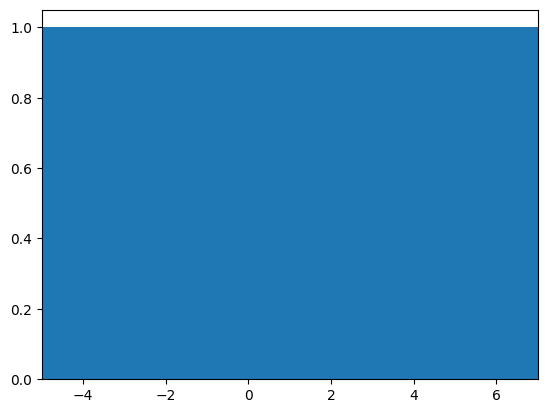

In [135]:
plt.hist(lambdas, bins=100)  # histogram with 100 bins
plt.xlim(-5, 7)  # eigenvalues between 0 and 2
plt.show()

In [136]:
lambdas.min()

(-2329.718318900045+0j)

In [137]:
lambdas.max()

(4552.856497040633+0j)

In [138]:
#The spectral ordering of a graph is an ordering of its nodes where nodes in the same weakly connected components appear 
#contiguous and ordered by their corresponding elements in the Fiedler vector of the component.
nx.spectral_ordering(knn_graph, weight='weight', normalized=False, tol=1e-08, method='tracemin_pcg', seed=None)

[2, 1, 0, 5, 6, 7, 8, 3, 9]

Largest eigenvalue: 1.4180594370340467
Smallest eigenvalue: 1.1102230246251565e-16


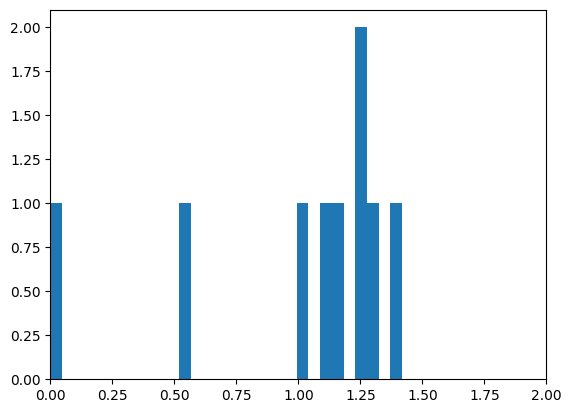

In [139]:
import numpy.linalg

L = nx.normalized_laplacian_matrix(G)
e = numpy.linalg.eigvals(L.toarray())
print("Largest eigenvalue:", max(e))
print("Smallest eigenvalue:", min(e))
plt.hist(e, bins=30)  # histogram with 100 bins
plt.xlim(0, 2)  # eigenvalues between 0 and 2
plt.show()

In [140]:
# M=nx.directed_modularity_matrix(G, nodelist=None, weight=None)
# M

In [141]:
# plt.figure(figsize=(20,10))
# plt.spy(M) 

In [142]:
#nx.average_shortest_path_length(knn_graph)

In [143]:
nx.shortest_path_length(knn_graph)

<generator object all_pairs_shortest_path_length at 0x7f74657a2a50>

In [144]:
p=nx.shortest_path(dist_graph)
p

{0: {0: [0],
  1: [0, 1],
  2: [0, 2],
  3: [0, 3],
  5: [0, 5],
  6: [0, 6],
  7: [0, 7],
  8: [0, 8],
  9: [0, 1, 9]},
 1: {1: [1],
  0: [1, 0],
  2: [1, 2],
  3: [1, 3],
  5: [1, 5],
  6: [1, 6],
  7: [1, 7],
  8: [1, 8],
  9: [1, 9]},
 2: {2: [2],
  0: [2, 0],
  1: [2, 1],
  5: [2, 5],
  3: [2, 0, 3],
  6: [2, 0, 6],
  7: [2, 0, 7],
  8: [2, 0, 8],
  9: [2, 1, 9]},
 3: {3: [3],
  0: [3, 0],
  1: [3, 1],
  5: [3, 5],
  6: [3, 6],
  7: [3, 7],
  8: [3, 8],
  9: [3, 9],
  2: [3, 0, 2]},
 4: {4: [4]},
 5: {5: [5],
  0: [5, 0],
  1: [5, 1],
  2: [5, 2],
  3: [5, 3],
  6: [5, 6],
  7: [5, 7],
  8: [5, 8],
  9: [5, 9]},
 6: {6: [6],
  0: [6, 0],
  1: [6, 1],
  3: [6, 3],
  5: [6, 5],
  7: [6, 7],
  8: [6, 8],
  9: [6, 9],
  2: [6, 0, 2]},
 7: {7: [7],
  0: [7, 0],
  1: [7, 1],
  3: [7, 3],
  5: [7, 5],
  6: [7, 6],
  8: [7, 8],
  9: [7, 9],
  2: [7, 0, 2]},
 8: {8: [8],
  0: [8, 0],
  1: [8, 1],
  3: [8, 3],
  5: [8, 5],
  6: [8, 6],
  7: [8, 7],
  9: [8, 9],
  2: [8, 0, 2]},
 9: {9: [9],

In [145]:
#nx.shortest_path(knn_graph)


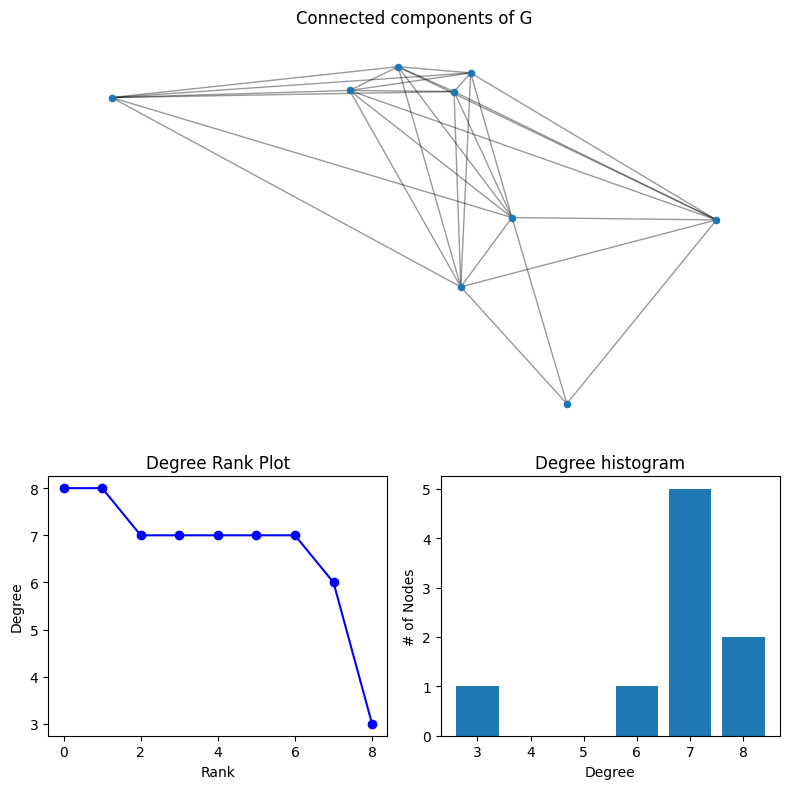

In [146]:
degree_sequence = sorted((d for n, d in G.degree()), reverse=True)
dmax = max(degree_sequence)

fig = plt.figure("Degree of a random graph", figsize=(8, 8))
# Create a gridspec for adding subplots of different sizes
axgrid = fig.add_gridspec(5, 4)

ax0 = fig.add_subplot(axgrid[0:3, :])
Gcc = G.subgraph(sorted(nx.connected_components(G), key=len, reverse=True)[0])
pos = nx.spring_layout(Gcc, seed=2022)
nx.draw_networkx_nodes(Gcc, positions, ax=ax0, node_size=20)
nx.draw_networkx_edges(Gcc, positions, ax=ax0, alpha=0.4)
ax0.set_title("Connected components of G")
ax0.set_axis_off()

ax1 = fig.add_subplot(axgrid[3:, :2])
ax1.plot(degree_sequence, "b-", marker="o")
ax1.set_title("Degree Rank Plot")
ax1.set_ylabel("Degree")
ax1.set_xlabel("Rank")

ax2 = fig.add_subplot(axgrid[3:, 2:])
ax2.bar(*np.unique(degree_sequence, return_counts=True))
ax2.set_title("Degree histogram")
ax2.set_xlabel("Degree")
ax2.set_ylabel("# of Nodes")

fig.tight_layout()
plt.show()

In [147]:
degree_sequence = sorted([d for n, d in G.degree()], reverse=True) # used for degree distribution and powerlaw test

In [148]:
!pip install powerlaw
import powerlaw # Power laws are probability distributions with the form:p(x)∝x−α
fit = powerlaw.Fit(degree_sequence) 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Calculating best minimal value for power law fit


In [149]:
fit = powerlaw.Fit(degree_sequence, xmin=1)

<Axes: >

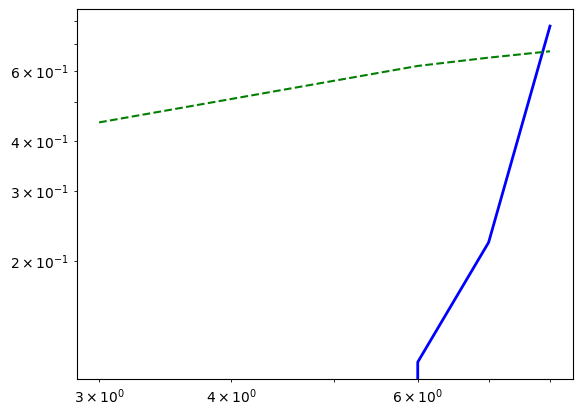

In [150]:
fig2 = fit.plot_cdf(color='b', linewidth=2)
fit.power_law.plot_cdf(color='g', linestyle='--', ax=fig2)

In [151]:
R, p = fit.distribution_compare('power_law', 'exponential', normalized_ratio=True)
print (R, p)

-11.965073023364308 5.4149930097397736e-33


<Axes: >

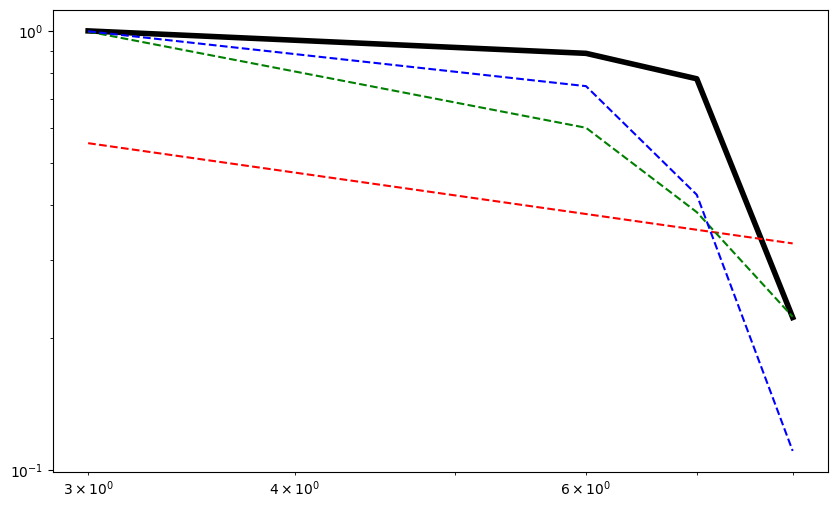

In [152]:
plt.figure(figsize=(10, 6))
fit.distribution_compare('power_law', 'lognormal')
fig4 = fit.plot_ccdf(linewidth=4, color='black')
fit.power_law.plot_ccdf(ax=fig4, color='r', linestyle='--') #powerlaw
fit.lognormal.plot_ccdf(ax=fig4, color='g', linestyle='--') #lognormal
fit.stretched_exponential.plot_ccdf(ax=fig4, color='b', linestyle='--') #stretched_exponential

In [153]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# for Notebook
%matplotlib inline

In [154]:
def draw(G, pos, measures, measure_name):
    
    nodes = nx.draw_networkx_nodes(G, pos, node_size=250, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys())
    nodes.set_norm(mcolors.SymLogNorm(linthresh=0.0001, linscale=1, base=10))
    # labels = nx.draw_networkx_labels(G, pos)
    edges = nx.draw_networkx_edges(G, pos)

    plt.title(measure_name)
    plt.colorbar(nodes)
    plt.axis('off')
    plt.show()

In [155]:
#G = nx.karate_club_graph()
G=dist_graph
pos = nx.spring_layout(G, seed=675)

In [156]:
DiG = nx.DiGraph()

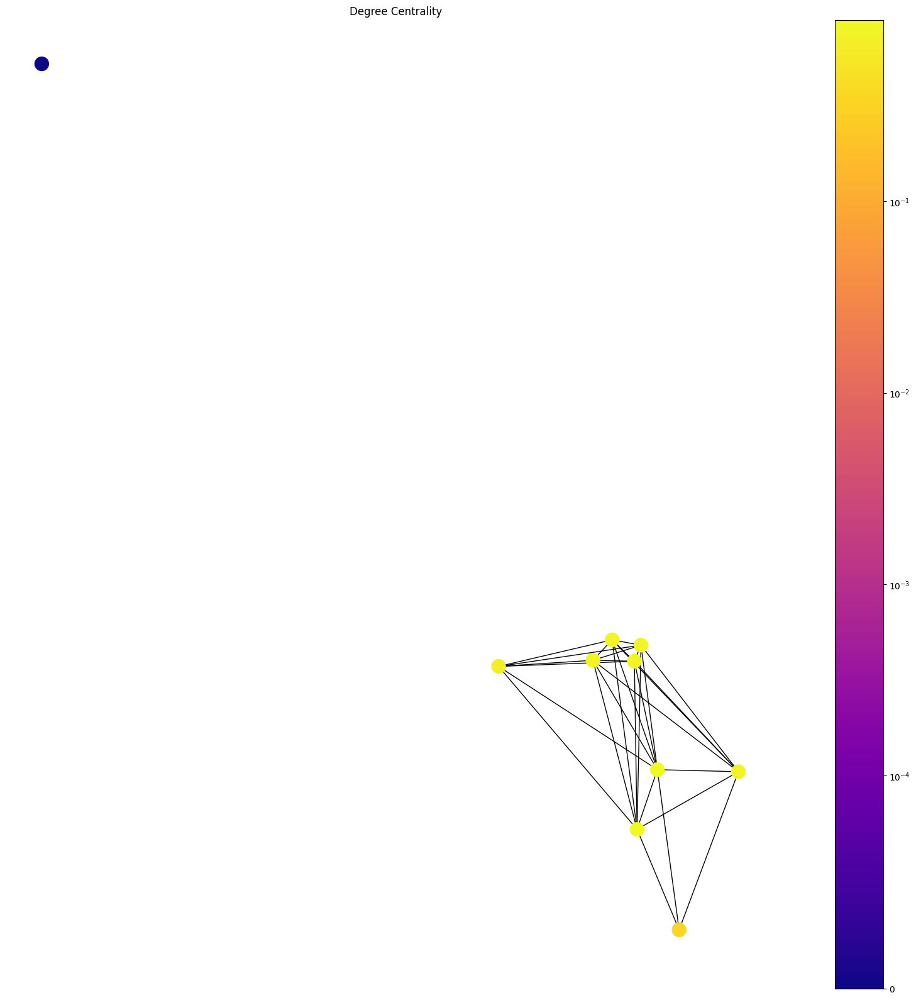

In [157]:
fig = plt.figure("Degree of a random graph", figsize=(20, 20))
draw(G, positions, nx.degree_centrality(G), 'Degree Centrality')

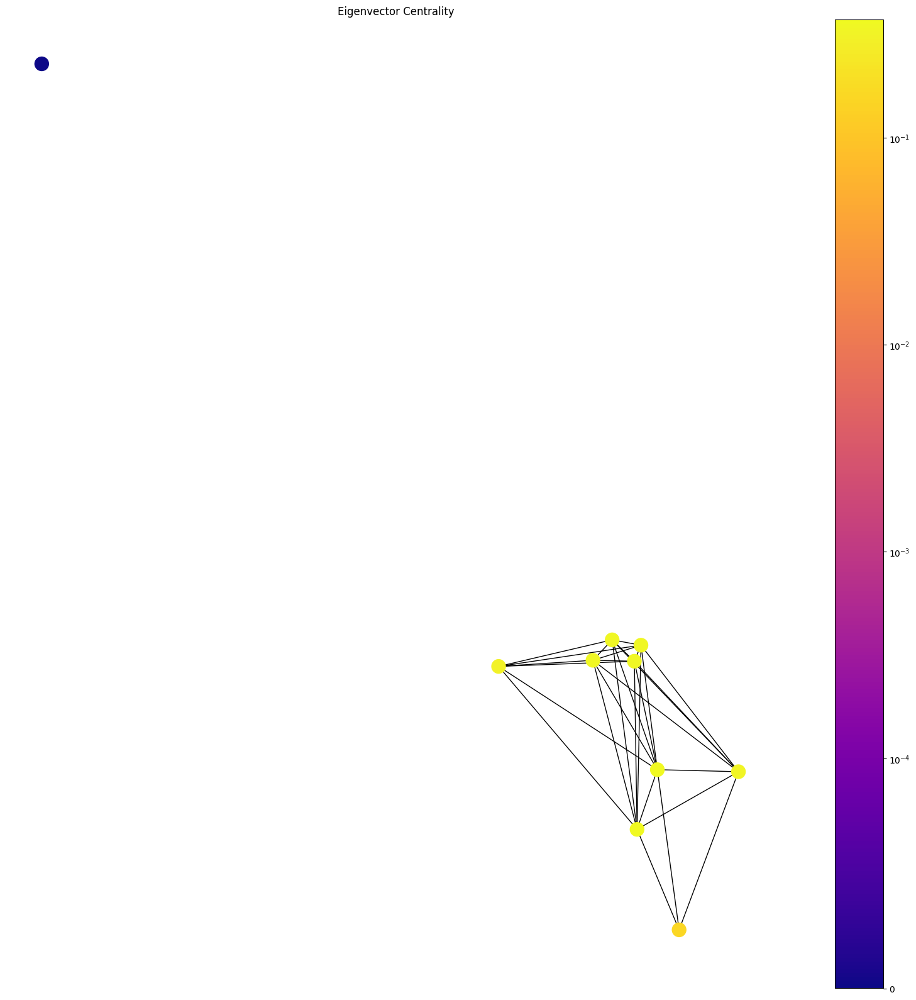

In [158]:
fig = plt.figure("Degree of a random graph", figsize=(20, 20))
draw(G, positions, nx.eigenvector_centrality_numpy(G), 'Eigenvector Centrality')

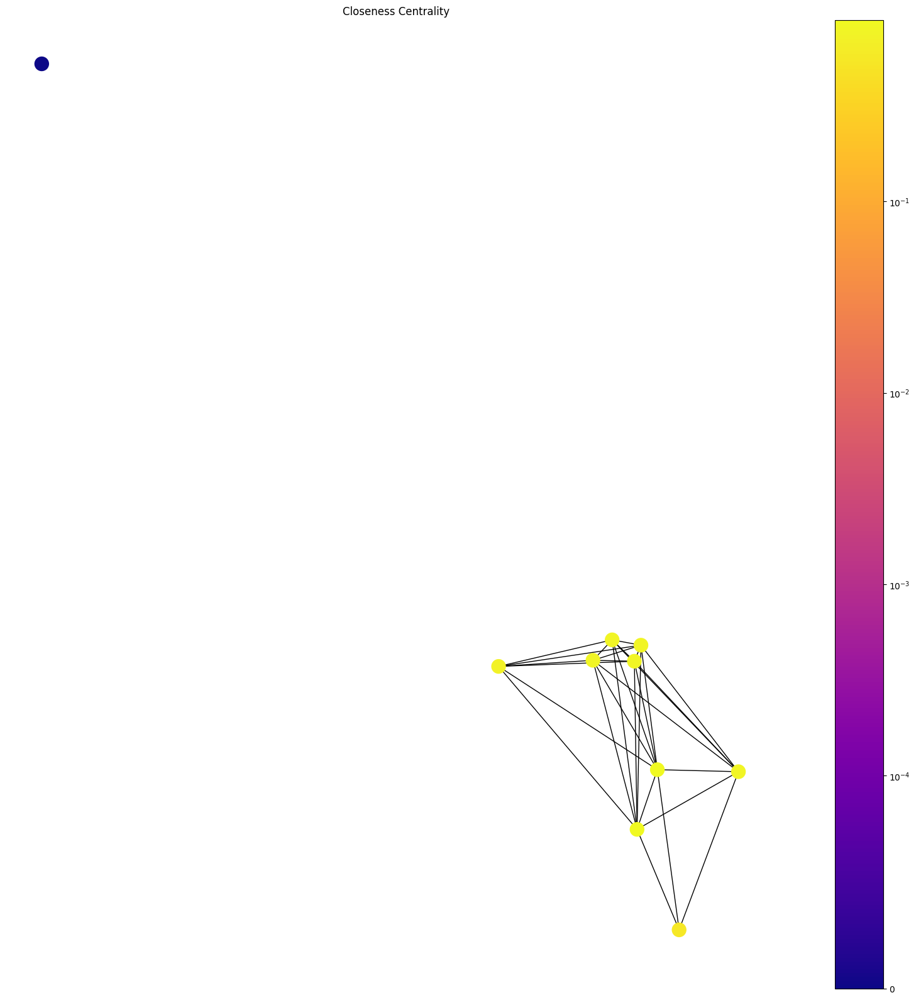

In [159]:
fig = plt.figure("Degree of a random graph", figsize=(20, 20))
draw(G, positions, nx.closeness_centrality(G), 'Closeness Centrality')

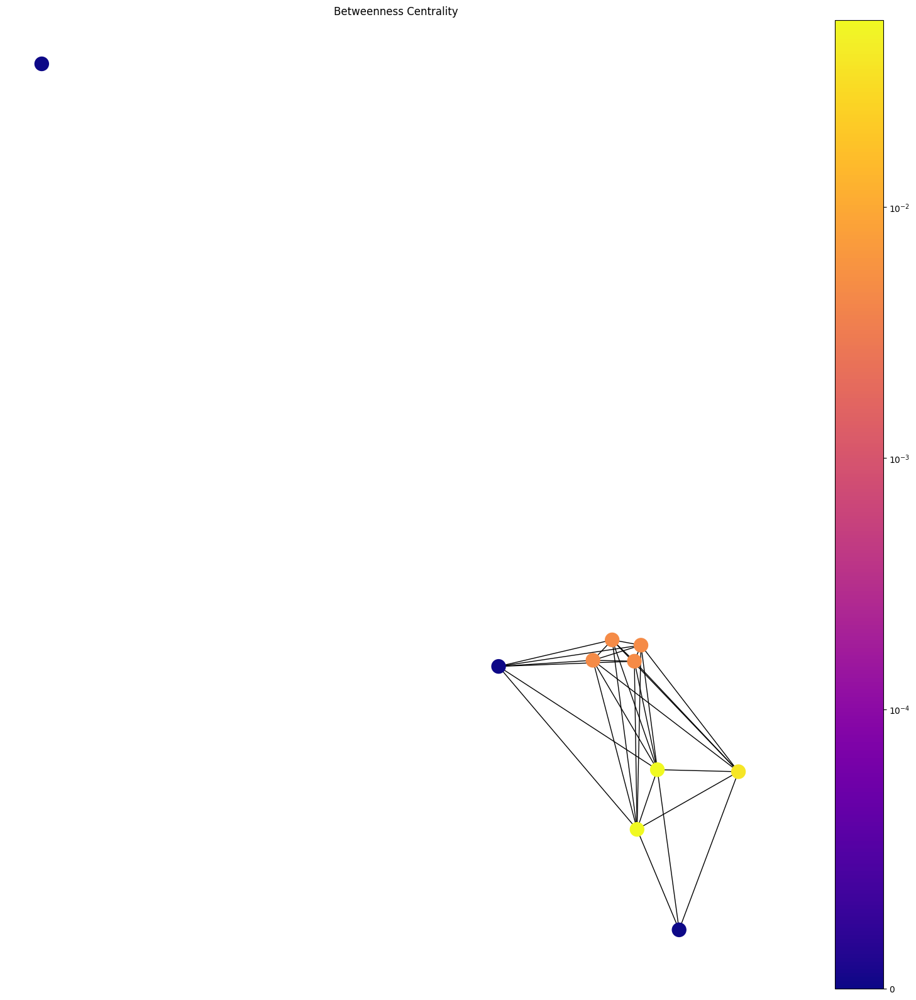

In [160]:
fig = plt.figure("Degree of a random graph", figsize=(20, 20))
draw(G, positions, nx.betweenness_centrality(G), 'Betweenness Centrality')

## Graficando metricas sobre el mapa

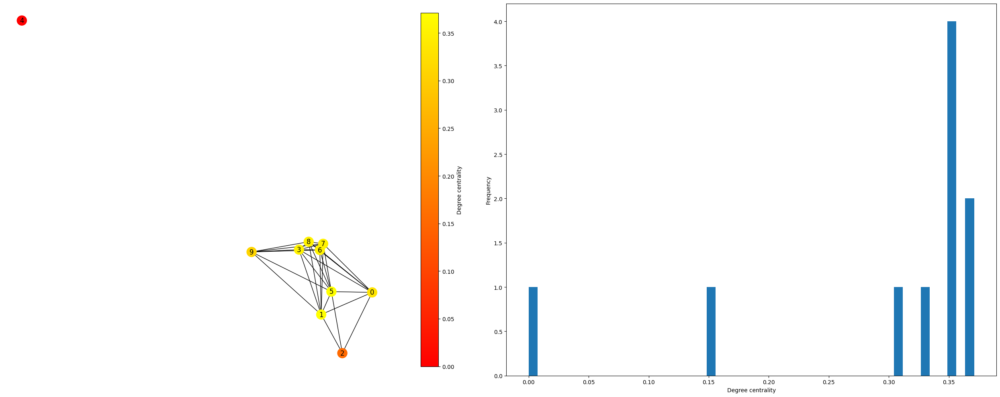

In [161]:
from matplotlib.cm import ScalarMappable
#gc=G.subgraph(max(nx.connected_components(G)))
lcc=nx.eigenvector_centrality_numpy(G)
#lcc= nx.degree_centrality(G)
#lcc = nx.clustering(G)
#lcc=nx.betweenness_centrality(G)
#lcc= nx.closeness_centrality(gc)
#lcc= nx.degree_centrality(gc)
#pos = nx.spring_layout(gc, seed=1)
cmap = plt.get_cmap('autumn')
norm = plt.Normalize(0, max(lcc.values()))
node_colors = [cmap(norm(lcc[node])) for node in G.nodes]

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(25, 10))

nx.draw(G, positions, node_color=node_colors, with_labels="Charco", ax=ax1)
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Degree centrality', shrink=0.95, ax=ax1)

ax2.hist(lcc.values(), bins=50)
ax2.set_xlabel('Degree centrality')
ax2.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

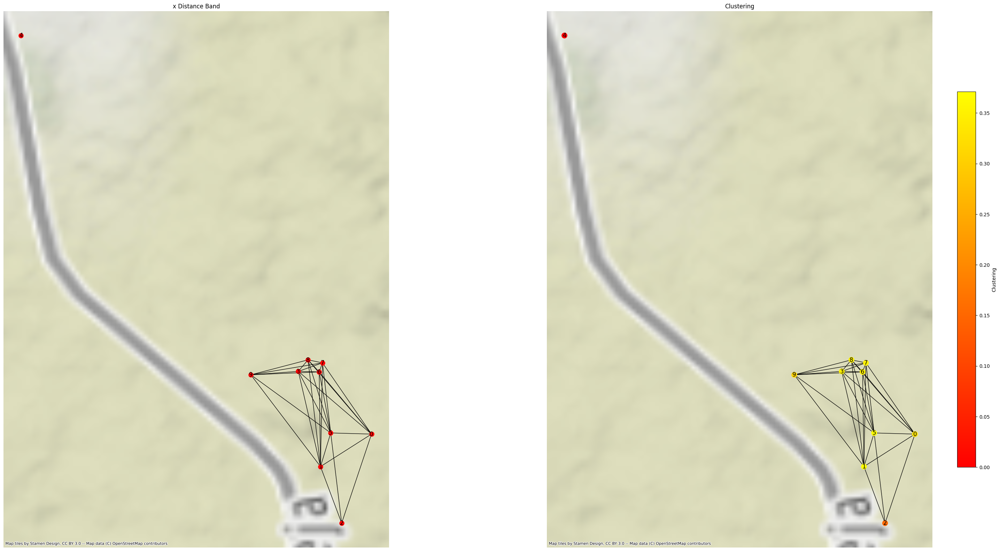

In [162]:
positions = dict(zip(dist_graph.nodes, coordinates_origen))
#positions=nx.spring_layout(knn_graph)
# plot with a nice basemap
f, ax = plt.subplots(1, 2, figsize=(40, 20))
for i, facet in enumerate(ax):
    df2.plot(marker=".",  alpha=1, color="k", ax=facet)
    add_basemap(facet, zoom=13, crs = df2.crs, url=ctx.providers.OpenStreetMap)
    facet.set_title(("x Distance Band", "Clustering" )[i])
    #facet.axis("off") 
nx.draw(G, positions, ax=ax[0], node_size=90, node_color="r", with_labels='Inv')
nx.draw(G, positions, ax=ax[1], node_size=120, node_color=node_colors, with_labels='Bullfrog_d')
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Clustering', shrink=0.7, ax=ax[1])
plt.show()